# SETUP:

In [1]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt

### Desenha os pontos de interesse entre as imagens:

In [20]:
def draw_matches(img1, keypoints1, img2, keypoints2, matches):
  r, c = img1.shape[:2]
  r1, c1 = img2.shape[:2]

  # Create a blank image with the size of the first image + second image
  output_img = np.zeros((max([r, r1]), c+c1, 3), dtype='uint8')
  output_img[:r, :c, :] = np.dstack([img1, img1, img1])
  output_img[:r1, c:c+c1, :] = np.dstack([img2, img2, img2])

  # Go over all of the matching points and extract them
  for match in matches:
    img1_idx = match.queryIdx
    img2_idx = match.trainIdx
    (x1, y1) = keypoints1[img1_idx].pt
    (x2, y2) = keypoints2[img2_idx].pt

    # Draw circles on the keypoints
    cv2.circle(output_img, (int(x1),int(y1)), 4, (0, 255, 255), 1)
    cv2.circle(output_img, (int(x2)+c,int(y2)), 4, (0, 255, 255), 1)

    # Connect the same keypoints
    cv2.line(output_img, (int(x1),int(y1)), (int(x2)+c,int(y2)), (0, 255, 255), 1)
    
  return output_img

### Realiza a 'costura' entre as imagens com base nos pontos de interesse:

In [21]:
def warpImages(img1, img2, H):

  rows1, cols1 = img1.shape[:2]
  rows2, cols2 = img2.shape[:2]

  list_of_points_1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
  temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)

  # When we have established a homography we need to warp perspective
  # Change field of view
  list_of_points_2 = cv2.perspectiveTransform(temp_points, H)

  list_of_points = np.concatenate((list_of_points_1,list_of_points_2), axis=0)

  [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
  [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)
  
  translation_dist = [-x_min,-y_min]
  
  H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

  output_img = cv2.warpPerspective(img2, H_translation.dot(H), (x_max-x_min, y_max-y_min))
  output_img[translation_dist[1]:rows1+translation_dist[1], translation_dist[0]:cols1+translation_dist[0]] = img1

  return output_img

### Função auxiliar para cortar as imagens com sobreposição 2 a 2:

In [22]:
# Função para cortar imagens em três partes de tamanho igual com sobreposição
def crop_images_with_overlap(images, overlap_fraction=0.45):
    cropped_images = []
    for img in images:
        h, w, _ = img.shape
        overlap = int(w * overlap_fraction)
        part_width = (w + 2 * overlap) // 3
        
        # Cortes com sobreposição
        left = img[:, :part_width//2]
        middle = img[:, part_width - overlap:part_width * 2 - overlap]
        right = img[:, part_width * 2 - 2 * overlap:]
        
        cropped_images.extend([left, middle, right])
    return cropped_images

### 'Costura' as imagens com sobreposição 2 a 2:

In [23]:
def stitching2(img1, img2):
  orb = cv2.ORB_create(nfeatures=10000)
  matcher = cv2.DescriptorMatcher_create("BruteForce-Hamming")
  keypoints_1, features_1 = orb.detectAndCompute(img1, None)
  keypoints_2, features_2 = orb.detectAndCompute(img2, None)

  rawMatches = matcher.knnMatch(features_1, features_2, 2)
  matches = []
  for m in rawMatches:
    if len(m) == 2 and m[0].distance < m[1].distance * 0.75:
      matches.append((m[0].trainIdx, m[0].queryIdx))

  if len(matches) >= 4:
    src_pts = np.float32([keypoints_1[i].pt for (_, i) in matches])
    dst_pts = np.float32([keypoints_2[i].pt for (i, _) in matches])

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [x_min, y_min] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-x_min, -y_min]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]]) @ H
    result = cv2.warpPerspective(img1, Ht, (x_max - x_min, y_max - y_min))
    result[t[1]:h2+t[1], t[0]:w2+t[0]] = img2

    coords = cv2.findNonZero(cv2.cvtColor(result, cv2.COLOR_BGR2GRAY))
    x, y, w, h = cv2.boundingRect(coords)
    result = result[y:y+h, x:x+w]

    return result

### Alinha as imagens:

In [24]:
def align(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  black = np.array([0,0,0])
  start_row = 0
  for i in range(image.shape[0]):
    if not np.array_equal(image[i,0], black):
      start_row = i
      break

  end_row = image.shape[0]-1
  for i in range(end_row,-1,-1):
    if not np.array_equal(image[i,0], black):
      end_row = i
      break

  return start_row, end_row

### 1. Escolha uma das metodologias que você implementou na segunda lista para gerar correspondências entre um par de imagens. Aplique-a em 5 pares de imagens (com sobreposição) para calcular suas homografias, e aplique-as para gerar panoramas entre os pares de imagens (um panorama por par).$\\$ Obs.: nessa questão, não  ́e permitido usar a API de alto nível Stitcher.$\\$ Dica: use a função warpPerspective da OpenCV. $\\$ A base de dados utilizada pode ser encontrada neste [caminho](https://www.kaggle.com/datasets/phsophea101/image-for-stitching?resource=download).

In [25]:
image_paths = [
    'atividade_3_imgs/q1/image_1a.jpg',
    'atividade_3_imgs/q1/image_1b.jpg',
    'atividade_3_imgs/q1/image_1c.jpg',
    'atividade_3_imgs/q1/image_1d.jpg',
    'atividade_3_imgs/q1/image_1e.jpg',
    'atividade_3_imgs/q1/image_2a.jpg', 
    'atividade_3_imgs/q1/image_2b.jpg',
    'atividade_3_imgs/q1/image_2c.jpg',
    'atividade_3_imgs/q1/image_2d.jpg',
    'atividade_3_imgs/q1/image_2e.jpg',
]

**Imagens utilizadas:**

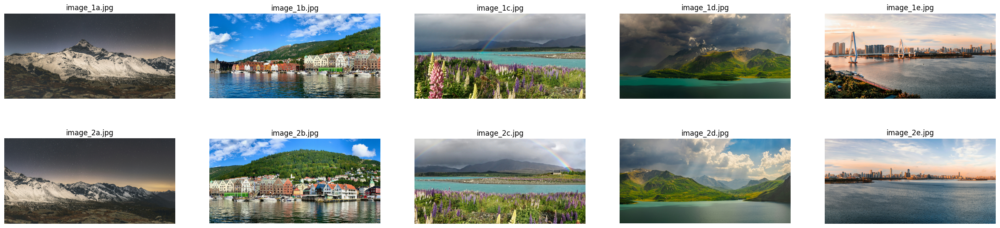

In [26]:
images = []
images_gray = []
for image_path in image_paths:
    img = cv2.imread(image_path)
    images.append(img)
    images_gray.append(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(30, 7))
for ax, img, title in zip(axes.flat, images, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{title.split('/')[-1]}")
    ax.axis('off')

Agora, vamos usar o detector ORB para extrair os pontos-chave. Primeiro, criaremos um detector ORB com a função `cv2.ORB_create()`. Esta função consiste em vários parâmetros opcionais. O mais útil é `nfeatures`, que denota o número máximo de recursos a serem detectados. Por padrão, esse número é definido como 500, mas podemos alterá-lo se quisermos detectar mais recursos. Em seguida, depois de especificarmos o número de pontos-chave que queremos detectar, detectaremos pontos-chave e descritores em ambas as imagens usando a função `orb.detectAndCompute()`.

In [27]:
orb = cv2.ORB_create(nfeatures=10000)

In [28]:
images_keypoints = []
images_descriptors = []

# Find the key points and descriptors with ORB
for image in images:
    keypoints, descriptors = orb.detectAndCompute(image, None)
    images_keypoints.append(keypoints)
    images_descriptors.append(descriptors)

In [29]:
mapped_images = []

for image, keypoint in zip(images, images_keypoints):
    mapped_images.append(cv2.drawKeypoints(image, keypoint, None, (0, 0, 255)))

**Imagens mapeadas**

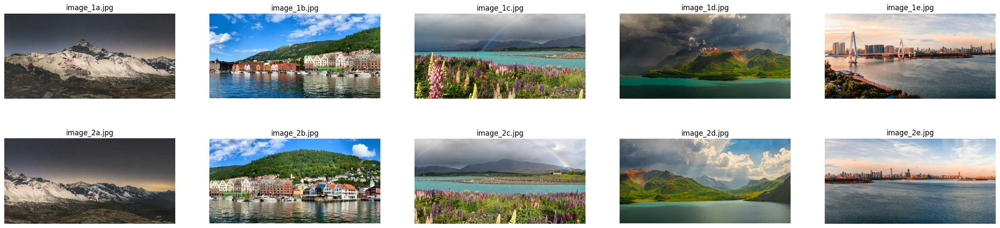

In [30]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(30, 7))
for ax, img, title in zip(axes.flat, mapped_images, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{title.split('/')[-1]}")
    ax.axis('off')

**Matching the points between two images**

In [31]:
MIN_MATCH_COUNT = 10
image_matches = []
results = []
bf = cv2.BFMatcher_create(cv2.NORM_HAMMING)

for i in range(5):
    matches = bf.knnMatch(images_descriptors[i], images_descriptors[i+5],k=2)
    good = []
    
    for m, n in matches:
        if m.distance < 0.6 * n.distance:
            good.append(m)
    img_matched = draw_matches(images_gray[i], images_keypoints[i], images_gray[i+5], images_keypoints[i+2], good)
    image_matches.append(img_matched)
    
    if len(good) > MIN_MATCH_COUNT:
        src_pts = np.float32([ images_keypoints[i][m.queryIdx].pt for m in good]).reshape(-1,1,2)
        dst_pts = np.float32([ images_keypoints[i+5][m.trainIdx].pt for m in good]).reshape(-1,1,2)

    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    result = warpImages(images[i+5], images[i], M)
    results.append(result)

**Todas as correspondencias entre as Imagens**

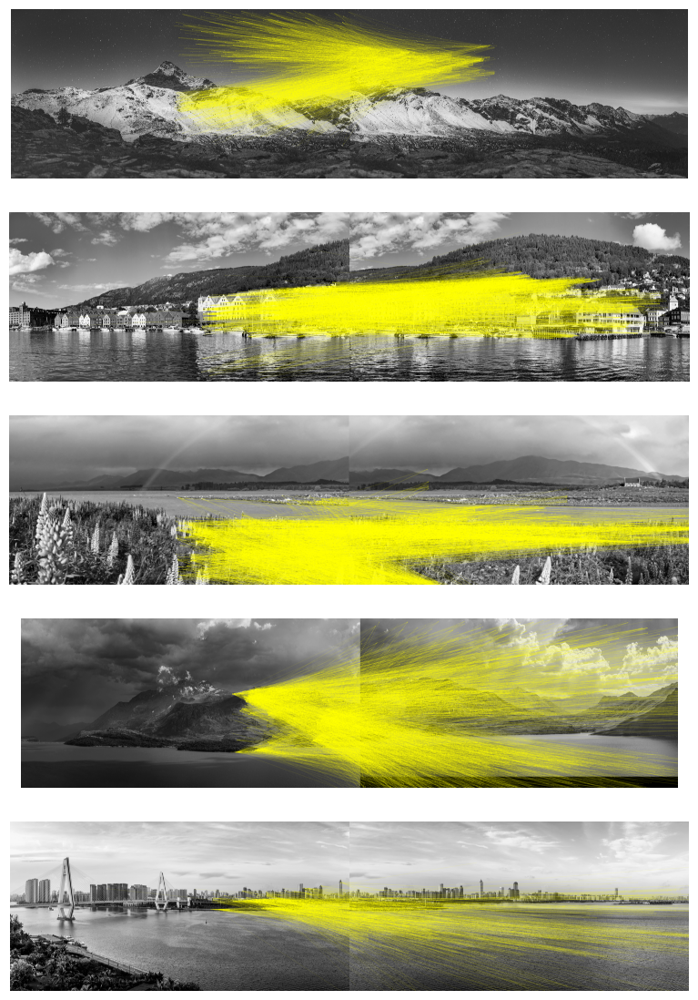

In [32]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(60, 14))
for ax, img in zip(axes.flat, image_matches):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

**Imagens 'Costuradas' com as correspondencias com uma distancia < 0.6**

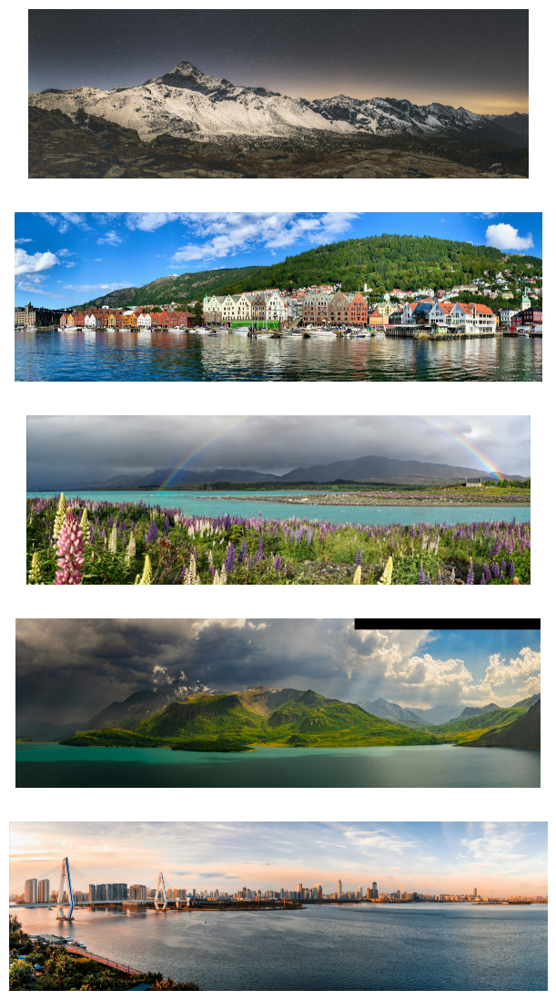

In [33]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(60, 14))
for ax, img in zip(axes.flat, results):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

### 2. Repita a questão anterior com 5 trios de imagens (com sobreposiçao 2 a 2), alinhando as imagens no plano da primeira imagem. Repita o mesmo alinhando no plano da segunda imagem, e da terceira imagem. Note que aqui será necessário compor as transformações de homografia em alguns casos, ou calcular inversas.

In [34]:
# Caminhos para as imagens
image_paths = [
    'atividade_3_imgs/image_a.jpg',
    'atividade_3_imgs/image_b.jpg',
    'atividade_3_imgs/image_c.jpg',
    'atividade_3_imgs/image_d.jpg',
    'atividade_3_imgs/image_e.jpg',
]

**Imagens Utilizadas:**

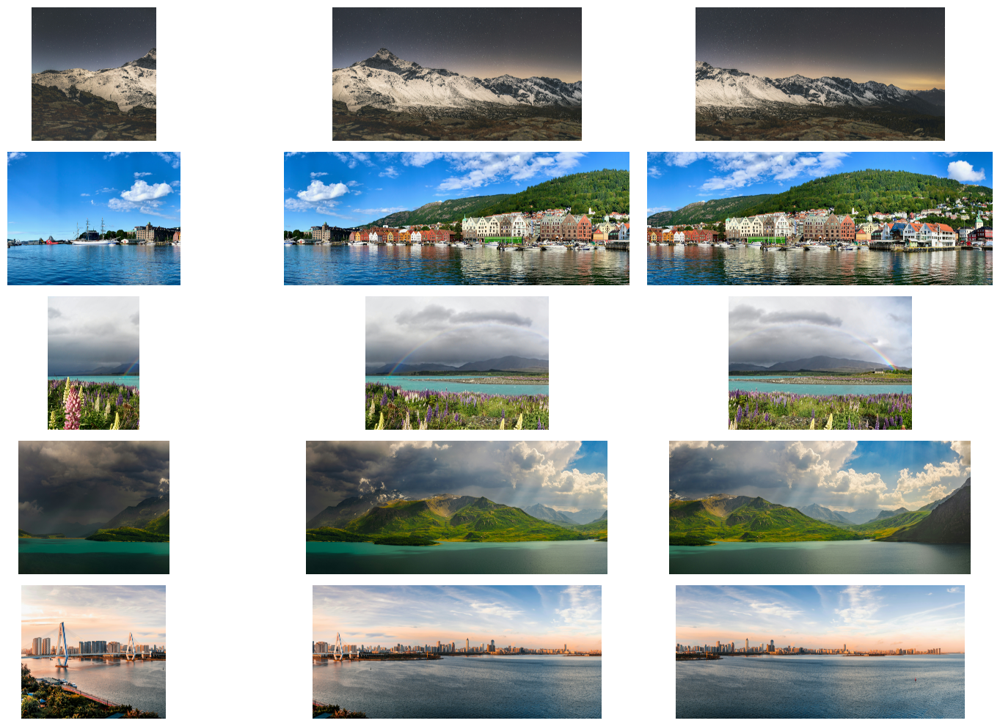

In [35]:
images = [cv2.imread(path) for path in image_paths]
cropped_images = crop_images_with_overlap(images)

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 10))

# Exibir cada parte cortada
for ax, img in zip(axes.flat, cropped_images):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

plt.tight_layout()
plt.show()

**Fluxo para identificar os pontos, alinhas as imagens e e formar o panorama final**

In [36]:
def build_panorama(images):
  n = len(images) - 1
  result = images[n]

  for i in range(n-1, -1, -1):
    result = stitching2(result, images[i])

  i, j = align(result)
  result = result[i:j, :]
  return result

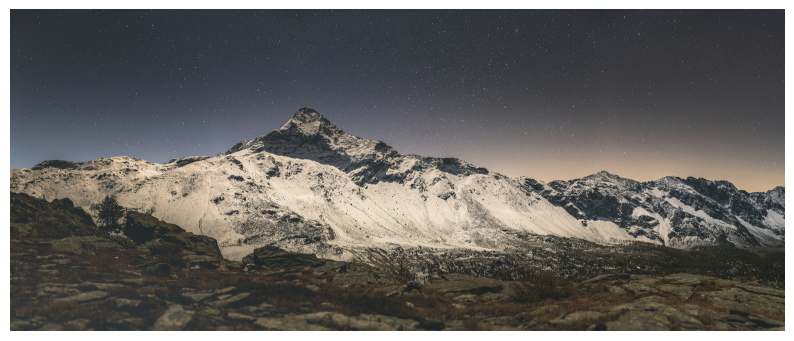

In [37]:
input_imgs = [
    'atividade_3_imgs/image_a.jpg'
]

images = [cv2.imread(path) for path in input_imgs]
cropped_images = crop_images_with_overlap(images)

final_panorama = build_panorama(cropped_images)
plt.figure(figsize=(10, 7))
plt.imshow(cv2.cvtColor(final_panorama, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

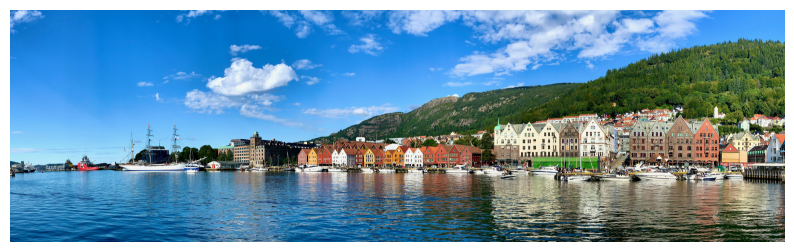

In [38]:
input_imgs = [
    'atividade_3_imgs/image_b.jpg'
]

images = [cv2.imread(path) for path in input_imgs]
cropped_images = crop_images_with_overlap(images)

final_panorama = build_panorama(cropped_images)
plt.figure(figsize=(10, 7))
plt.imshow(cv2.cvtColor(final_panorama, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

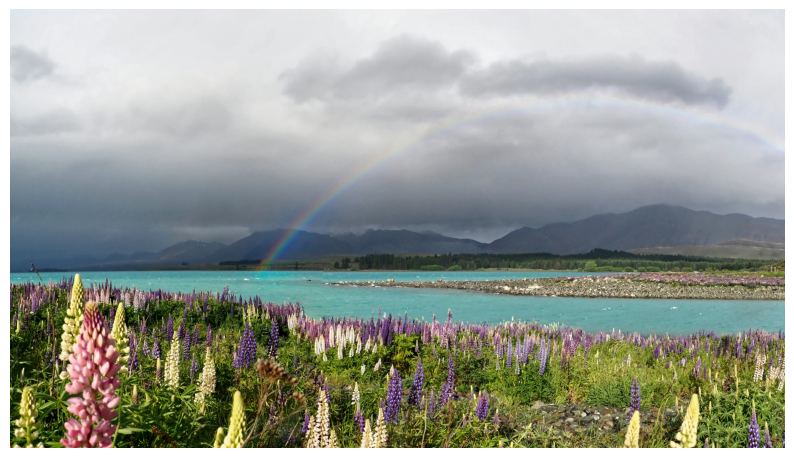

In [39]:
input_imgs = [
    'atividade_3_imgs/image_c.jpg'
]

images = [cv2.imread(path) for path in input_imgs]
cropped_images = crop_images_with_overlap(images)

final_panorama = build_panorama(cropped_images)
plt.figure(figsize=(10, 7))
plt.imshow(cv2.cvtColor(final_panorama, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

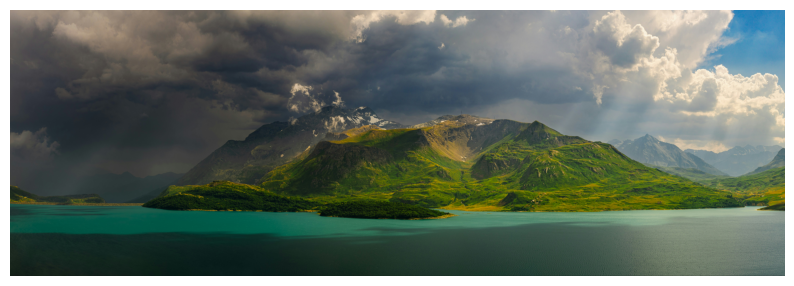

In [40]:
input_imgs = [
    'atividade_3_imgs/image_d.jpg'
]

images = [cv2.imread(path) for path in input_imgs]
cropped_images = crop_images_with_overlap(images)

final_panorama = build_panorama(cropped_images)
plt.figure(figsize=(10, 7))
plt.imshow(cv2.cvtColor(final_panorama, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

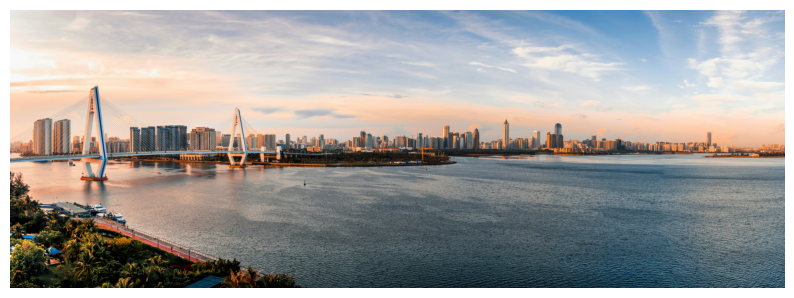

In [41]:
input_imgs = [
    'atividade_3_imgs/image_e.jpg'
]

images = [cv2.imread(path) for path in input_imgs]
cropped_images = crop_images_with_overlap(images)

final_panorama = build_panorama(cropped_images)
plt.figure(figsize=(10, 7))
plt.imshow(cv2.cvtColor(final_panorama, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### 3. Use homografias para trocar as bandeiras dos países na imagem abaixo (e em anexo no classroom) por outras bandeiras. Preencha também a placa de publicidade onde há o nome ”London 2012” por outra imagem de publicidade de sua escolha. O seguinte [tutorial](https://medium.com/acmvit/how-to-project-an-image-in-perspective-view-of-a-background-image-opencv-python-d101bdf966bc) foi utilizado como base para a solução desta atividade.

Variáveis de controle:

In [42]:
positions=[] 
positions2=[]
count=0

Função para abrir a imagem e coletar as coordenadas das bandeiras:

In [43]:
def select_coordenates(final):
    def draw_circle(event,x,y,flags,param):
        global positions,count
        # If event is Left Button Click then store the coordinate in the lists, positions and positions2
        if event == cv2.EVENT_LBUTTONUP:
            cv2.circle(final,(x,y),2,(255,0,0),-1)
            positions.append([x,y])
            if(count!=3):
                positions2.append([x,y])
            elif(count==3):
                positions2.insert(2,[x,y])
            count+=1
    # Defing a window named 'image'
    cv2.namedWindow('image')
    cv2.setMouseCallback('image',draw_circle)

    while(True):
        cv2.imshow('image',final)
        k = cv2.waitKey(20) & 0xFF
        if k == 27:
            break
    cv2.destroyAllWindows()

Imagens utilizadas no processo:

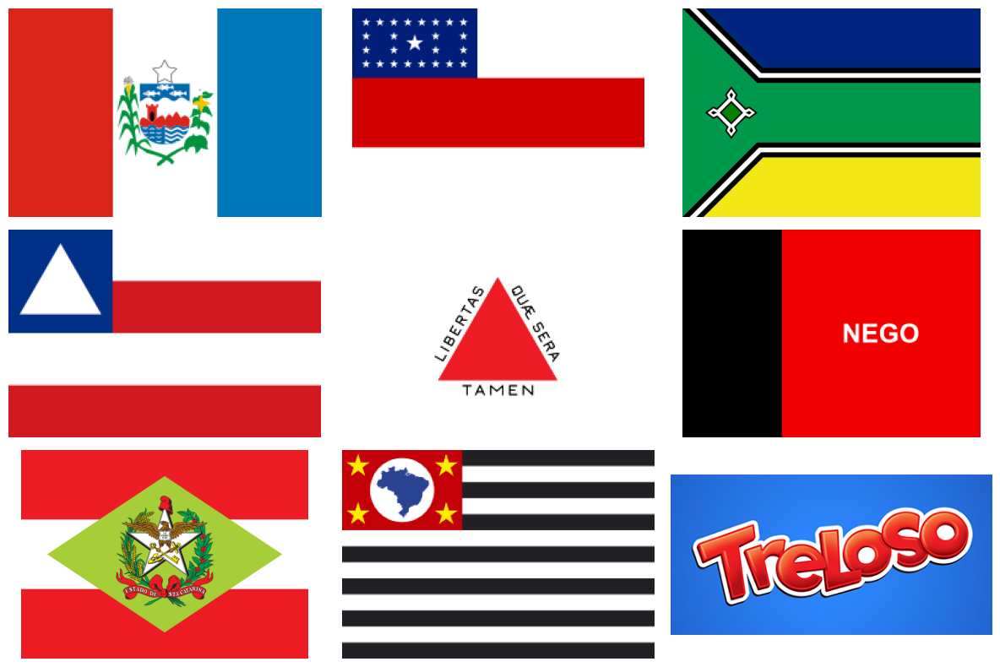

In [44]:
input_imgs = [
    'atividade_3_imgs/q3/al.png',
    'atividade_3_imgs/q3/am.png',
    'atividade_3_imgs/q3/ap.png',
    'atividade_3_imgs/q3/ba.png',
    'atividade_3_imgs/q3/mg.png',
    'atividade_3_imgs/q3/pb.png',
    'atividade_3_imgs/q3/sc.png',
    'atividade_3_imgs/q3/sp.png',
    'atividade_3_imgs/q3/treloso.png',
]

images = [cv2.imread(path) for path in input_imgs]

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 8))

# Exibir cada parte cortada
for ax, img in zip(axes.flat, images):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

plt.tight_layout()
plt.show()

Fluxo que coleta a imagem da piscina e as bandeiras e realiza a troca:

In [45]:
for image in input_imgs:
    if image == 'atividade_3_imgs/q3/al.png':
        pool = cv2.imread('atividade_3_imgs/q3/inicial.jpg')
    else:
        pool = cv2.imread('atividade_3_imgs/q3/final.jpg')
    
    input = cv2.imread(image)

    positions=[] 
    positions2=[]
    count=0

    height, width = pool.shape[:2]
    h1,w1 = input.shape[:2]

    select_coordenates(pool)
    pts1=np.float32([[0,0],[w1,0],[0,h1],[w1,h1]])
    pts2=np.float32(positions)
    h, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC,5.0)

    height, width, channels = pool.shape
    im1Reg = cv2.warpPerspective(input, h, (width, height))
    mask2 = np.zeros(pool.shape, dtype=np.uint8)

    roi_corners2 = np.int32(positions2)

    channel_count2 = pool.shape[2]  
    ignore_mask_color2 = (255,)*channel_count2

    cv2.fillConvexPoly(mask2, roi_corners2, ignore_mask_color2)

    mask2 = cv2.bitwise_not(mask2)
    masked_image2 = cv2.bitwise_and(pool, mask2)

    #Using Bitwise or to merge the two images
    final = cv2.bitwise_or(im1Reg, masked_image2)
    cv2.imwrite('atividade_3_imgs/q3/final.jpg',final)

Resultado

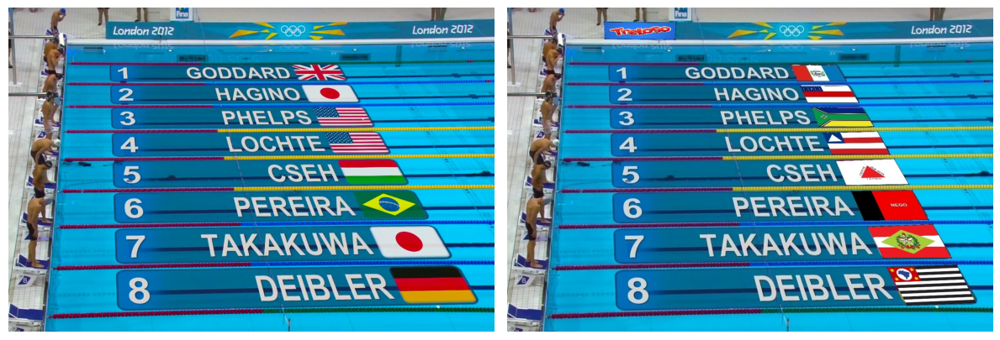

In [46]:
input_imgs = [
    'atividade_3_imgs/q3/inicial.jpg',
    'atividade_3_imgs/q3/final.jpg',
]

images = [cv2.imread(path) for path in input_imgs]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 8))

# Exibir cada parte cortada
for ax, img in zip(axes.flat, images):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

plt.tight_layout()
plt.show()

### 4. Leia o seguinte tutorial de calibração de câmera: https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html Você vai precisar de um tabuleiro de xadrez (pode imprimir numa folha A4, e colar num papelão para que a geometria fique fixa). Meça as dimensões do seu tabuleiro para calibrar a câmera, considerando que o tabuleiro sempre está no plano \( z = 0 \), e que o canto inferior esquerdo do tabuleiro é a origem \((0,0,0)\). Após calibrar a câmera, vamos incluir um objeto virtual na imagem. Considere a seguinte equação paramétrica do círculo centrado no ponto \( (1.5W, 1.5H, 0) \), com raio \( r = 0.5W \) e contido no plano \( z = 0 \), onde \( H \) e \( W \) são as medidas da altura e largura do tabuleiro:

$\begin{equation}
p ( \theta ) = ( r \cos\theta + 1.5W, r \sin\theta + 1.5H, 0 )
\end{equation}$


### Se assegure de que o círculo apareça na imagem, de acordo com a posição do xadrez na imagem. Para desenhar o círculo, varie o valor do ângulo $ \theta $ entre 0 e $2\pi$ para amostrar alguns pontos, e projete-os na imagem. Repita isso 3 vezes, variando o ângulo entre o vetor normal do tabuleiro e o eixo principal da câmera.


In [69]:
# Critérios de terminação
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objp = np.zeros((7*7, 3), np.float32)
objp[:,:2] = np.mgrid[0:7, 0:7].T.reshape(-1, 2)

objpoints = [] # pontos 3d no espaço real
imgpoints = [] # pontos 2d no plano da imagem.

In [70]:
images = glob.glob('atividade_3_imgs/q4/*.jpeg')
chess_board = []

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Encontrar os cantos do tabuleiro
    ret, corners = cv2.findChessboardCorners(gray, (7,7), None)
    print(ret)

    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners)

        # Desenhar e exibir os cantos
        chess = cv2.drawChessboardCorners(img, (7,7), corners2, ret)
        chess_board.append(chess)

True
True
True


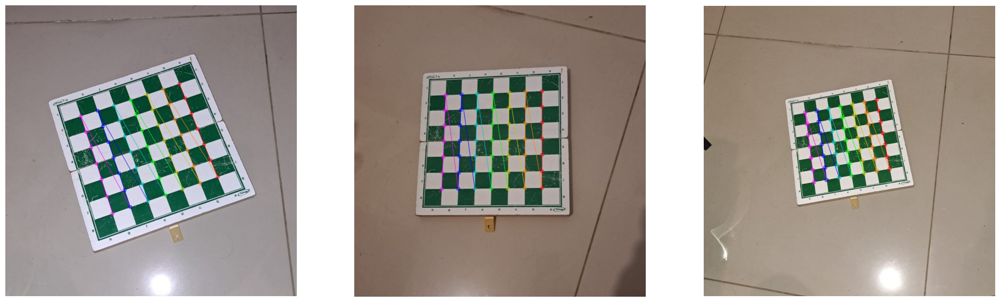

In [71]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 16))

for ax, img in zip(axes.flat, chess_board):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')

In [72]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [113]:
H = 0.3 # altura do tabuleiro em metros
W = 0.3 # largura do tabuleiro em metros
r = 0.5 * W  # raio do círculo é metade da largura do tabuleiro

In [114]:
num_points = 360
angle_step = 2 * np.pi / num_points

In [ ]:
#Equação paramétrica do circulo
circle_points = np.array([[r * np.cos(i * angle_step) + (W * 1.5), r * np.sin(i * angle_step) + (H * 1.5), 0] for i in range(num_points)], dtype=np.float32)

In [115]:
results = []
for idx, path in enumerate(images):
    image = cv2.imread(path)
    image_points, _ = cv2.projectPoints(circle_points, rvecs[idx], tvecs[idx], mtx, dist)
    for i in range(len(image_points)):
        next_i = (i + 1) % len(image_points)
        result = cv2.line(image, tuple(image_points[i][0].astype(int)), tuple(image_points[next_i][0].astype(int)), (0, 0, 255), 2)
    results.append(result)

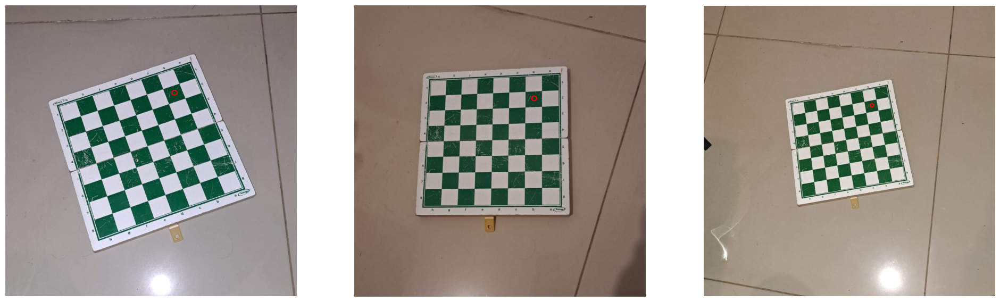

In [116]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 16))

for ax, img in zip(axes.flat, results):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis('off')